# SyriaTel Customer Churn

## Business understanding

Customer retention is a problem for SyriaTel, a telecom provider. Customers that discontinue using a business's services are referred to as churn. Since keeping existing customers is frequently more economical than finding new ones, churn prediction is an essential task. The objective is to create a classifier that can forecast if a customer will "soon" cease doing business with SyriaTel.

###Problem Statement.

Creating a predictive model that can precisely identify clients who are at danger of churning is the main challenge. The objective is to identify trends and indicators linked to churn by examining past customer data, such as service consumption patterns, invoicing details, and customer interactions. This knowledge will enable the company to apply focused retention tactics, like tailored promotions or enhanced customer service.

###Objectives

1.   Develop a binary classification model that would predict whether a customer will churn or not.
2.   Identifying features that would have an impact on customer churn.
3.   Enhancing predictive accuracy by use of appropriate preprocessing and feature selection.
4.   Optimizing model performance through feature engineering and tuning.
5.   Determine churn prediction using metrics like accuracy and recall.

###Success Criteria

1.   Achieving a model accuracy and recall of atleast 85% in churn.
2.   Minimizing false positives to avoid unnecessary retention cost.


##Data Understanding.

In [66]:
#Importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import LabelEncoder
warnings.filterwarnings('ignore')
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, ConfusionMatrixDisplay
from sklearn.preprocessing import OrdinalEncoder
from scipy.stats.mstats import winsorize
from scipy.stats import boxcox
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import (
    classification_report, confusion_matrix,
    accuracy_score, precision_score, recall_score, f1_score
)
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, precision_score, recall_score, f1_score
from sklearn.model_selection import train_test_split
from sklearn.tree import plot_tree
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import plot_tree


In [67]:
#Importing dataset
data=pd.read_csv('/content/bigml_59c28831336c6604c800002a.csv')
data.head()

,state,account length,area code,phone number,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,...,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls,churn
0,KS,128,415,382-4657,no,yes,25,265.1,110,45.07,...,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,371-7191,no,yes,26,161.6,123,27.47,...,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,358-1921,no,no,0,243.4,114,41.38,...,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,375-9999,yes,no,0,299.4,71,50.90,...,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,330-6626,yes,no,0,166.7,113,28.34,...,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


In [68]:
#Checking columns and rows
data.shape

(3333, 21)

In [69]:
#Checking the columns
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [70]:
#Checking details of the dataset
data.describe()

,account length,area code,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,total eve charge,total night minutes,total night calls,total night charge,total intl minutes,total intl calls,total intl charge,customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


##Data Cleaning

####Handling Missing Values

In [71]:
#Checking for missing values
data.isna().sum()

,0
state,0
account length,0
area code,0
phone number,0
international plan,0
voice mail plan,0
number vmail messages,0
total day minutes,0
total day calls,0
total day charge,0


We can see that there is no missing values in the dataset.

####Handling Duplicates.

In [72]:
#Checking duplicates
data.duplicated().sum()

0

We can see that we do not have any duplicated values in the dataset.

####Handling outliers

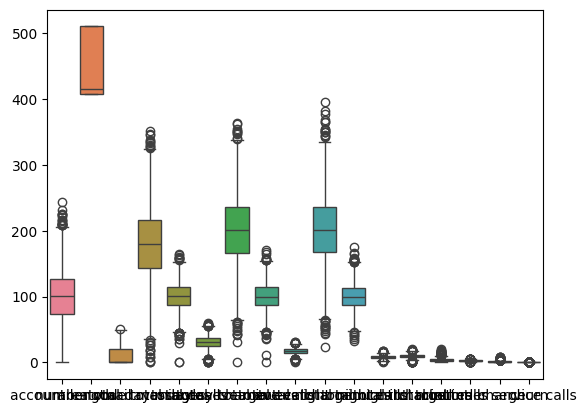

In [73]:
#Checking for outliers
sns.boxplot(data=data)
plt.show()

In [74]:
#Checking skewness
outlier_columns = ['total day minutes', 'total day calls', 'total day charge']
skewness_outliers = data[outlier_columns].skew()
print(skewness_outliers)

total day minutes   -0.029077
total day calls     -0.111787
total day charge    -0.029083
dtype: float64


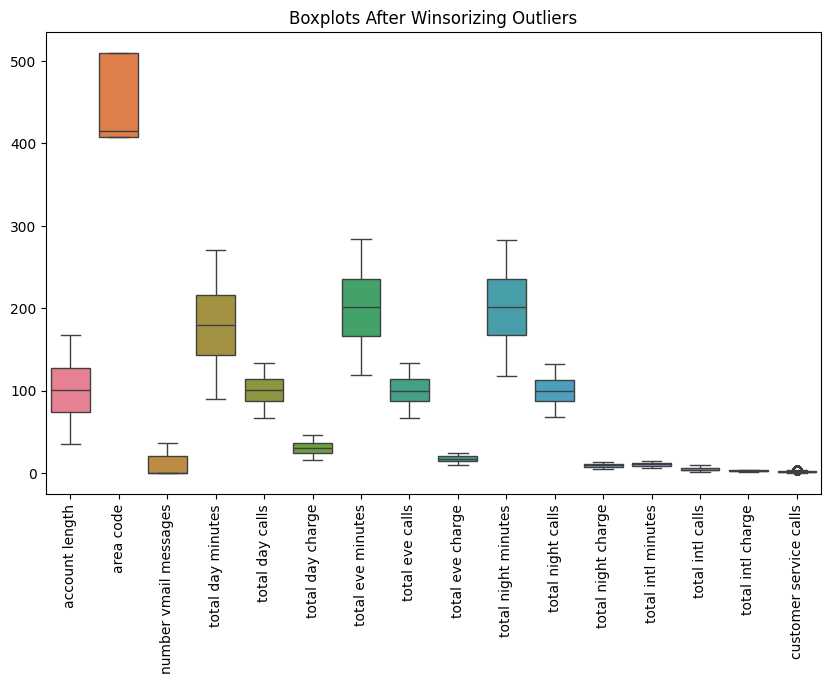

In [75]:
from scipy.stats.mstats import winsorize
import matplotlib.pyplot as plt
import seaborn as sns

# Creating a copy of the data to avoid modifying the original dataset
data_clean = data.copy()

# Applying winsorization to numeric columns
outlier_columns = data_clean.select_dtypes(include=[np.number]).columns

for col in outlier_columns:
# Winsorizing the data, limiting top and bottom 5% of values
    data_clean[col] = winsorize(data_clean[col], limits=[0.05, 0.05])

# Visualizing the boxplots to check for outliers
plt.figure(figsize=(10, 6))
sns.boxplot(data=data_clean[outlier_columns])
plt.xticks(rotation=90)
plt.title('Boxplots After Winsorizing Outliers')
plt.show()


In [76]:
# Defining IQR-based bounds
Q1 = data_clean['customer service calls'].quantile(0.25)
Q3 = data_clean['customer service calls'].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# Filtering out outliers
data_clean = data_clean[(data_clean['customer service calls'] >= lower_bound) &
                        (data_clean['customer service calls'] <= upper_bound)]


##EDA

### Univariate Analysis.

In [77]:
#Check the distribution of categorical variables
print(data['churn'].value_counts())
print(data['international plan'].value_counts())
print(data['voice mail plan'].value_counts())

churn
False    2850
True      483
Name: count, dtype: int64
international plan
no     3010
yes     323
Name: count, dtype: int64
voice mail plan
no     2411
yes     922
Name: count, dtype: int64


We can see that the dataset is imbalanced.When building a model we would need to handle the imbalance.

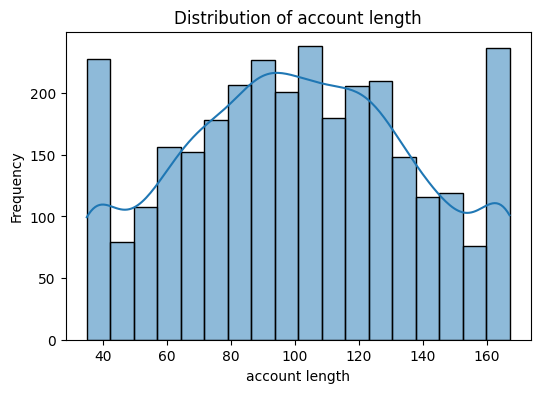

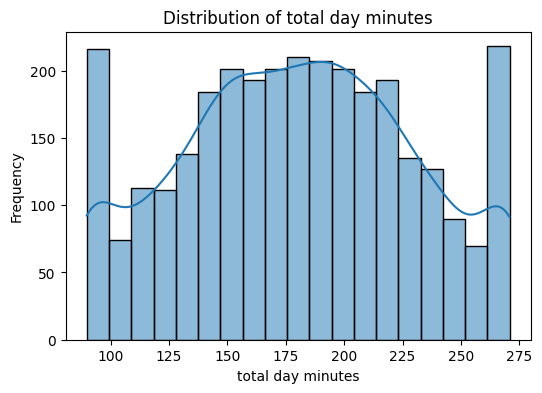

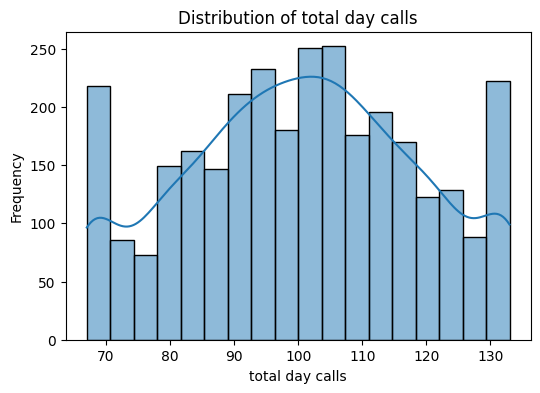

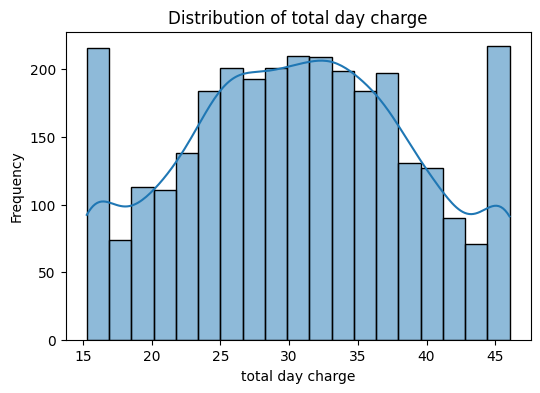

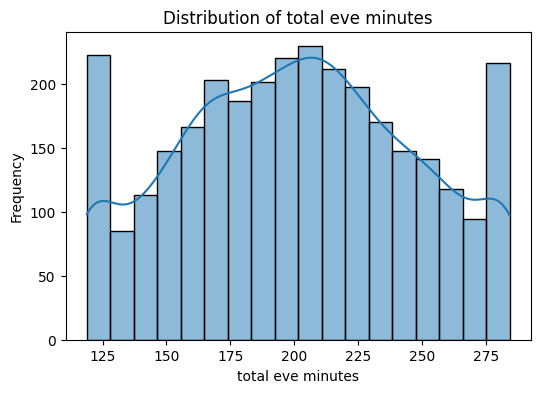

...

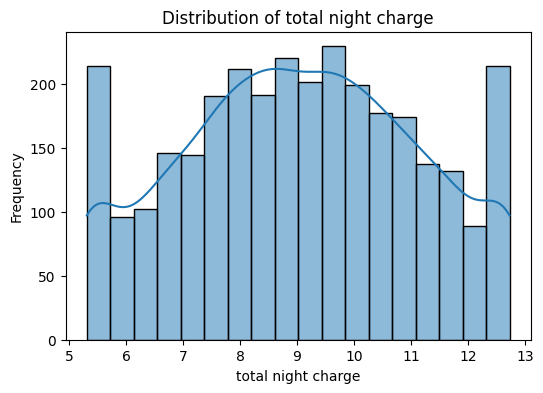

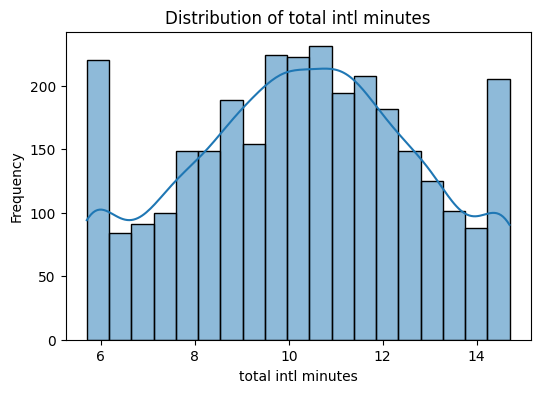

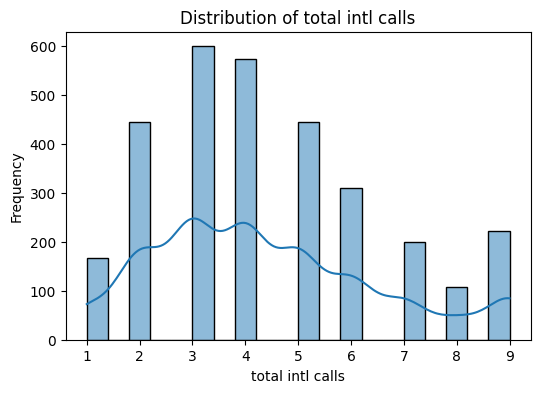

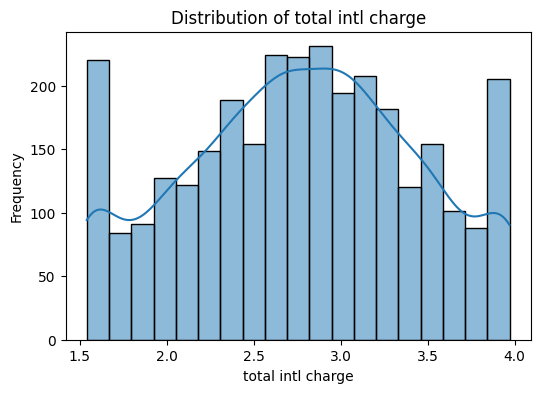

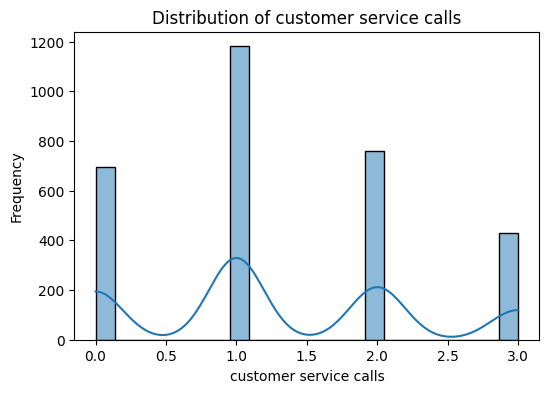

In [78]:
#Visualizing numerical variables using histograms
numerical_columns = ['account length', 'total day minutes', 'total day calls',
                     'total day charge', 'total eve minutes', 'total eve calls',
                     'total eve charge', 'total night minutes', 'total night calls',
                     'total night charge', 'total intl minutes', 'total intl calls',
                     'total intl charge', 'customer service calls']
for column in numerical_columns:
    plt.figure(figsize=(6, 4))
    sns.histplot(data_clean[column], kde=True)
    plt.title(f'Distribution of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')
    plt.show()

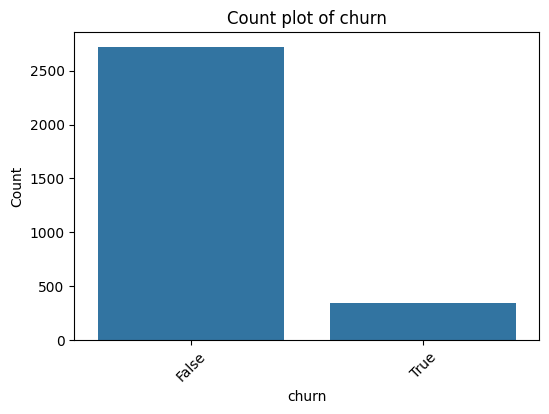

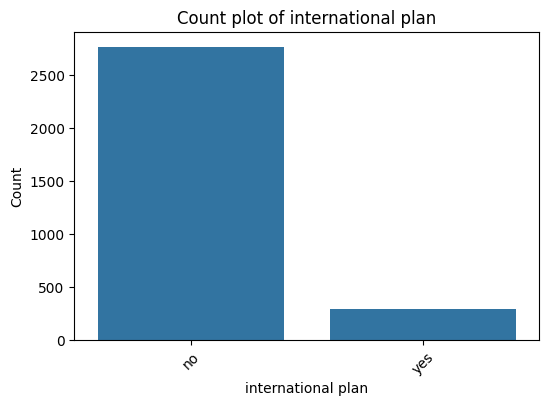

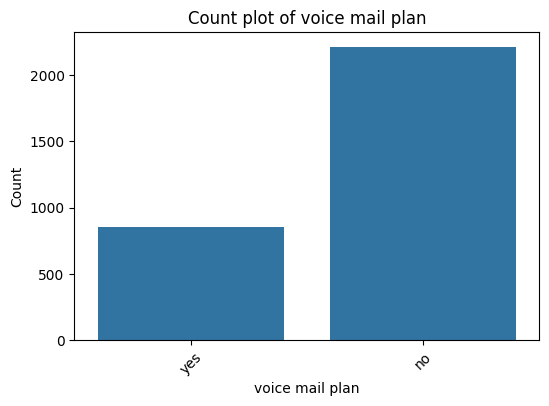

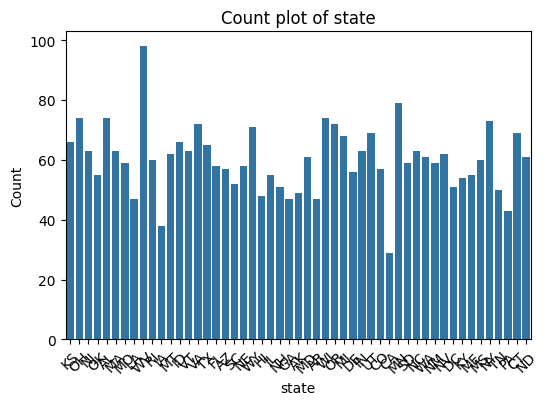

In [79]:
#Visualizing categorical variables using bar plots
categorical_columns = ['churn', 'international plan', 'voice mail plan', 'state']

for column in categorical_columns:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=data_clean[column])
    plt.title(f'Count plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    plt.xticks(rotation=45)
    plt.show()

###Bivariate analysis

We will check the relationship between different variables with churn.

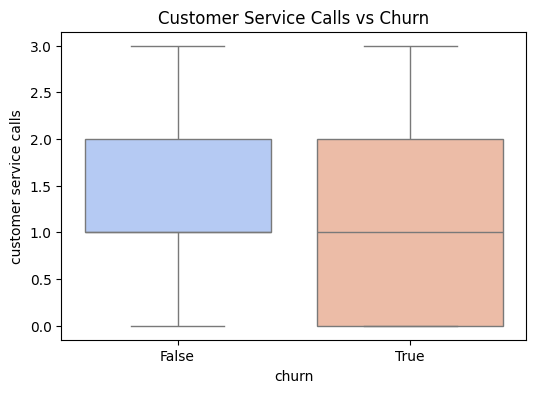

In [80]:
#Boxplot of Customer Service Calls vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='customer service calls', data=data_clean, palette='coolwarm')
plt.title('Customer Service Calls vs Churn')
plt.show()

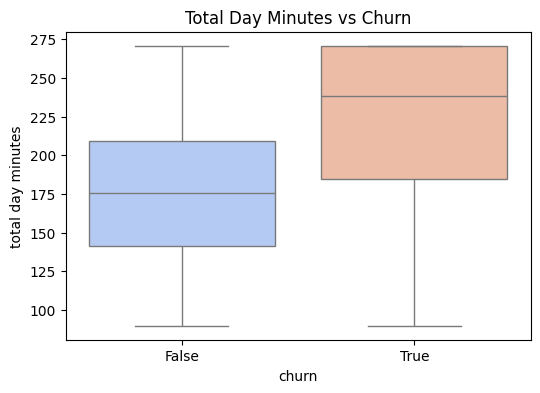

In [81]:
#Total Day Minutes vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total day minutes', data=data_clean, palette='coolwarm')
plt.title('Total Day Minutes vs Churn')
plt.show()

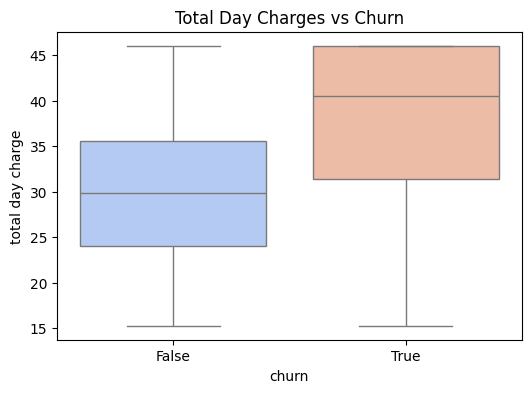

In [82]:
#Boxplot of Total Day Charges vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total day charge', data=data_clean, palette='coolwarm')
plt.title('Total Day Charges vs Churn')
plt.show()

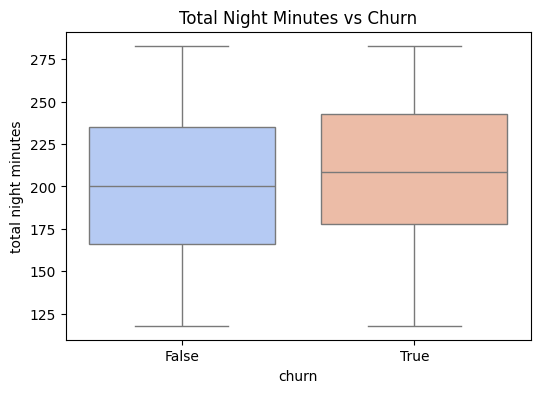

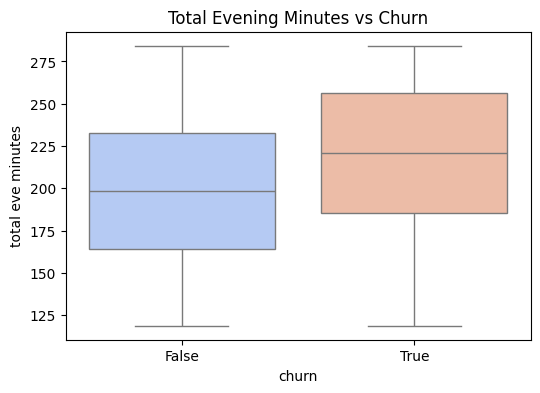

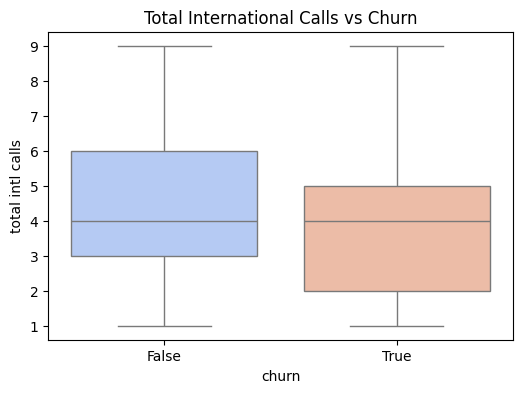

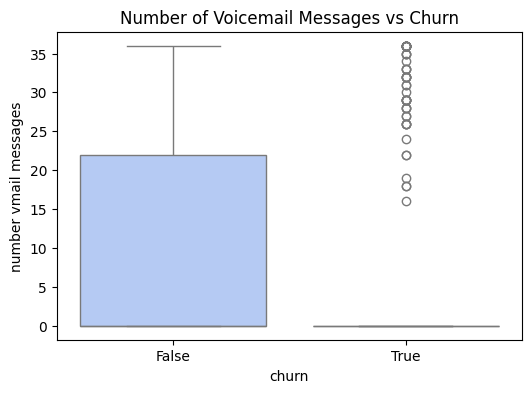

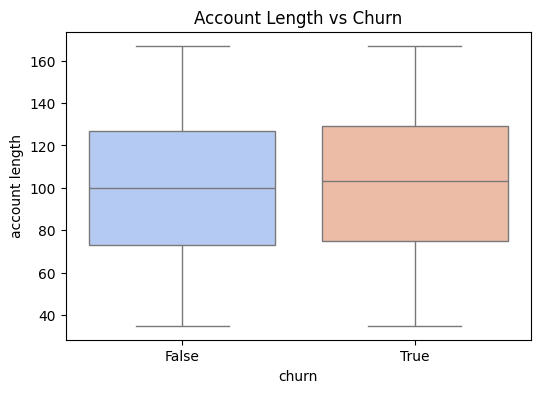

In [83]:

# 4. Total Night Minutes vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total night minutes', data=data_clean, palette='coolwarm')
plt.title('Total Night Minutes vs Churn')
plt.show()

# 5. Total Eve Minutes vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total eve minutes', data=data_clean, palette='coolwarm')
plt.title('Total Evening Minutes vs Churn')
plt.show()

# 6. Total Intl Calls vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='total intl calls', data=data_clean, palette='coolwarm')
plt.title('Total International Calls vs Churn')
plt.show()

# 7. Number of Voicemail Messages vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='number vmail messages', data=data_clean, palette='coolwarm')
plt.title('Number of Voicemail Messages vs Churn')
plt.show()

# 8. Account Length vs Churn
plt.figure(figsize=(6, 4))
sns.boxplot(x='churn', y='account length', data=data_clean, palette='coolwarm')
plt.title('Account Length vs Churn')
plt.show()

### Multivariate Analysis

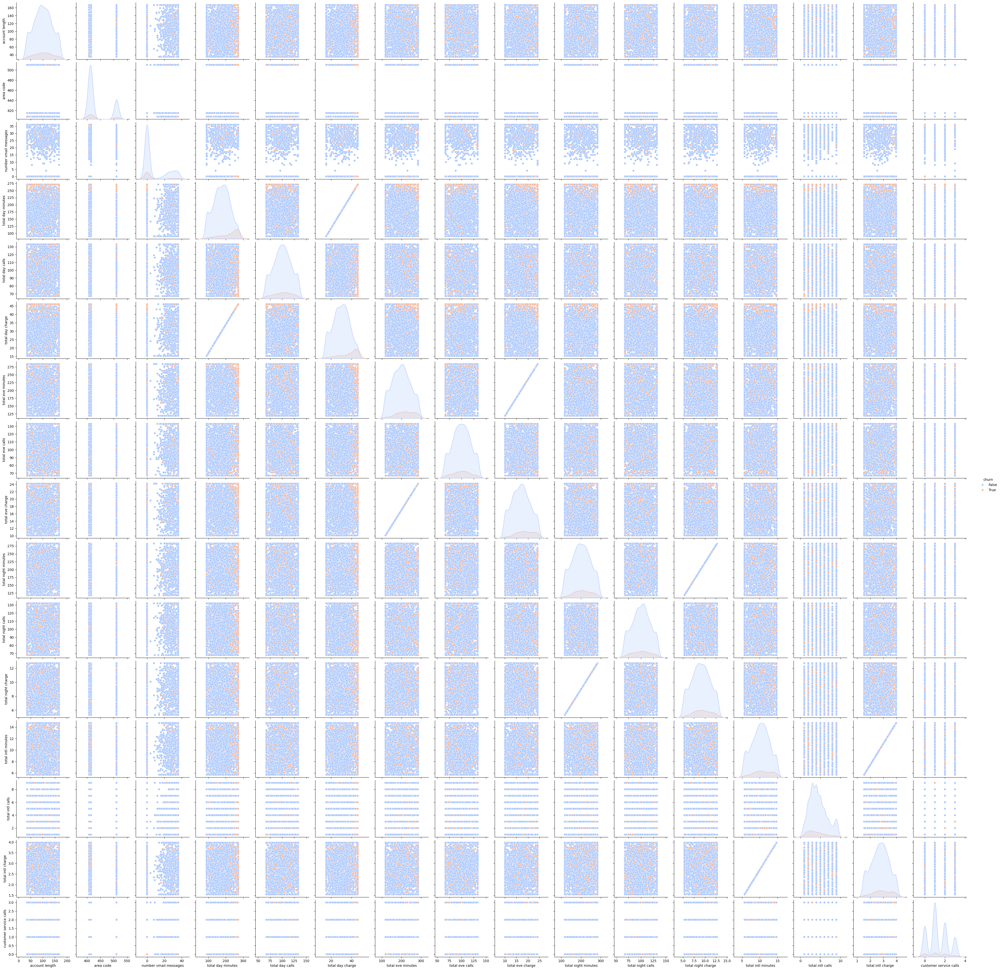

In [84]:
# Creating a pairplot with 'churn' as the hue
sns.pairplot(data_clean, hue='churn', diag_kind='kde', palette='coolwarm')
plt.show()


Exploring relationship between multiple numerical variables.

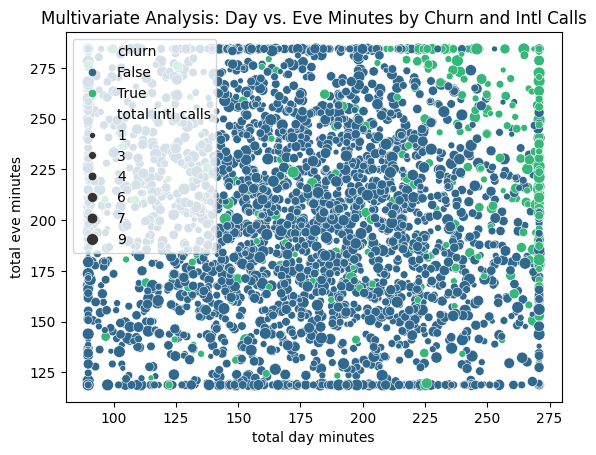

In [85]:
#Plotting a scatterplot
sns.scatterplot(data=data_clean, x='total day minutes', y='total eve minutes',
                hue='churn', size='total intl calls', palette='viridis')
plt.title('Multivariate Analysis: Day vs. Eve Minutes by Churn and Intl Calls')
plt.show()

## Feature Engineering

##Preprocessing

###Encoding

In [86]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3333 entries, 0 to 3332
Data columns (total 21 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   state                   3333 non-null   object 
 1   account length          3333 non-null   int64  
 2   area code               3333 non-null   int64  
 3   phone number            3333 non-null   object 
 4   international plan      3333 non-null   object 
 5   voice mail plan         3333 non-null   object 
 6   number vmail messages   3333 non-null   int64  
 7   total day minutes       3333 non-null   float64
 8   total day calls         3333 non-null   int64  
 9   total day charge        3333 non-null   float64
 10  total eve minutes       3333 non-null   float64
 11  total eve calls         3333 non-null   int64  
 12  total eve charge        3333 non-null   float64
 13  total night minutes     3333 non-null   float64
 14  total night calls       3333 non-null   

In [87]:
# Checking for unique values for all columns in the dataset
for column in data_clean.columns:
    print(f"Column: {column}")
    print(data_clean[column].unique())
    print("\n")


Column: state
['KS' 'OH' 'NJ' 'OK' 'AL' 'MA' 'MO' 'LA' 'WV' 'RI' 'IA' 'MT' 'ID' 'VT'
 'VA' 'TX' 'FL' 'AZ' 'SC' 'NE' 'WY' 'HI' 'IL' 'NH' 'GA' 'AK' 'MD' 'AR'
 'WI' 'OR' 'MI' 'DE' 'IN' 'UT' 'CO' 'CA' 'MN' 'SD' 'NC' 'WA' 'NM' 'NV'
 'DC' 'KY' 'ME' 'MS' 'NY' 'TN' 'PA' 'CT' 'ND']


Column: account length
[128 107 137  84  75 118 121 147 117 141  74 167  95  85  93  76  73 130
 111 132  57  54  35  49 142  72  36  78 136 149  98 135 160  64  59  65
  97  52  60  96  81  68 125 116  38  40  43 113 126 138 162  90  50  82
  46  70 144  55 106 155  80 104 120  77 108 122 157 103  63 112  41  92
 131 163  91 127 110 140  83 145  56 151 139 115  87  62 146 148  94  67
 164  51  53 105  66  99  86  88 123  45 100 119 114 101 143  48  71  89
 166 158  39 129  44  79 124  37 159 154 150 133  61  58 109 102 165 161
  47  69 153 152  42 156 134]


Column: area code
[415 408 510]


Column: phone number
['382-4657' '371-7191' '358-1921' ... '328-8230' '364-6381' '400-4344']


Column: international plan
['

In [88]:
encoded_data = data_clean.copy()

In [89]:
#Encoding for binary columns
binary_cols = ['international plan', 'voice mail plan', 'churn']
le = LabelEncoder()

for col in binary_cols:
    encoded_data[col] = le.fit_transform(encoded_data[col])

I used label encoding for the binary categorical features like churn,international plan and voice mail plan because they only have 2 categories.

In [90]:
#Performing one hot encoding on state column
nominal_cols = ['state']
encoded_data = pd.get_dummies(encoded_data, columns=nominal_cols, drop_first=True)

I used One hot encoding on state because it is a categorical variable without a natural order

In [91]:
#Mapping 'customer service calls' to categories and applying Ordinal Encoding
service_call_mapping = {
    0: 'Low',
    1: 'Medium',
    2: 'Medium',
    3: 'High'
}

# Creating a new column with mapped categories
encoded_data['service_calls_category'] = encoded_data['customer service calls'].map(service_call_mapping)

# Initializing OrdinalEncoder with custom categories
ordinal_encoder = OrdinalEncoder(categories=[['Low', 'Medium', 'High']])

# Performing ordinal encoding
encoded_data['service_calls_encoded'] = ordinal_encoder.fit_transform(encoded_data[['service_calls_category']])


In [92]:
#Dropping unnecessary columns (e.g., 'phone number')
encoded_data.drop(columns=['phone number'], inplace=True)

In [93]:
print(encoded_data.head())

   account length  area code  international plan  voice mail plan  \
0             128        415                   0                1   
1             107        415                   0                1   
2             137        415                   0                0   
3              84        408                   1                0   
4              75        415                   1                0   

   number vmail messages  total day minutes  total day calls  \
0                     25              265.1              110   
1                     26              161.6              123   
2                      0              243.4              114   
3                      0              270.8               71   
4                      0              166.7              113   

   total day charge  total eve minutes  total eve calls  ...  state_TX  \
0             45.07              197.4               99  ...     False   
1             27.47              195.5              

In [94]:
encoded_data.head()

,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,service_calls_category,service_calls_encoded
0,128,415,0,1,25,265.1,110,45.07,197.4,99,...,False,False,False,False,False,False,False,False,Medium,1.0
1,107,415,0,1,26,161.6,123,27.47,195.5,103,...,False,False,False,False,False,False,False,False,Medium,1.0
2,137,415,0,0,0,243.4,114,41.38,121.2,110,...,False,False,False,False,False,False,False,False,Low,0.0
3,84,408,1,0,0,270.8,71,46.04,118.8,88,...,False,False,False,False,False,False,False,False,Medium,1.0
4,75,415,1,0,0,166.7,113,28.34,148.3,122,...,False,False,False,False,False,False,False,False,High,2.0


In [95]:
encoded_data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 3066 entries, 0 to 3332
Data columns (total 71 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   account length          3066 non-null   int64  
 1   area code               3066 non-null   int64  
 2   international plan      3066 non-null   int64  
 3   voice mail plan         3066 non-null   int64  
 4   number vmail messages   3066 non-null   int64  
 5   total day minutes       3066 non-null   float64
 6   total day calls         3066 non-null   int64  
 7   total day charge        3066 non-null   float64
 8   total eve minutes       3066 non-null   float64
 9   total eve calls         3066 non-null   int64  
 10  total eve charge        3066 non-null   float64
 11  total night minutes     3066 non-null   float64
 12  total night calls       3066 non-null   int64  
 13  total night charge      3066 non-null   float64
 14  total intl minutes      3066 non-null   float

In [96]:
#Encoding
X = pd.get_dummies(encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore'), drop_first=True)
y = encoded_data['churn']

###Scaling

In [97]:
#Checking skewness of encoded data
# Selecting the numeric columns from the encoded data
numeric_cols = encoded_data.select_dtypes(include=np.number).columns.tolist()

# Calculating skewness of each numeric column
for col in numeric_cols:
    skewness = encoded_data[col].skew()
    print(f"Skewness of {col}: {skewness}")


Skewness of account length: 0.016797105922797324
Skewness of area code: 1.1321925006869205
Skewness of international plan: 2.739895021222735
Skewness of voice mail plan: 0.9957926403378395
Skewness of number vmail messages: 1.1857906539088157
Skewness of total day minutes: 0.0026505608144232673
Skewness of total day calls: -0.03436494836213147
Skewness of total day charge: 0.0029342233646236417
Skewness of total eve minutes: 0.021394788963979096
Skewness of total eve calls: -0.00594727152831499
Skewness of total eve charge: 0.0219479953113009
Skewness of total night minutes: -0.0203147931180745
Skewness of total night calls: -0.032946385228113474
Skewness of total night charge: -0.020437786582870064
Skewness of total intl minutes: -0.06571943071584205
Skewness of total intl calls: 0.5694510505992043
Skewness of total intl charge: -0.06519879514086246
Skewness of customer service calls: 0.2858946663135606
Skewness of churn: 2.453494968043412
Skewness of service_calls_encoded: 0.03507018

Based on the output we will figure out how to handle scaling.

In [98]:
# Creating a copy of the encoded data for transformations
transformed_data = encoded_data.copy()
# Identifying numerical columns
numeric_cols = transformed_data.select_dtypes(include=np.number).columns.tolist()


On the highly skewed columns we perform log transformation before scaling to reduce skewness.

In [99]:
# Initializing scalers
standard_scaler = StandardScaler()
min_max_scaler = MinMaxScaler()

# Identifying columns based on skewness
low_skew_cols = ['account length', 'total day minutes', 'total day calls', 'total day charge',
                  'total eve minutes', 'total eve calls', 'total eve charge',
                  'total night minutes', 'total night calls', 'total night charge',
                  'total intl minutes', 'total intl calls', 'total intl charge',
                  'customer service calls', 'service_calls_encoded']

high_skew_cols = ['area code', 'international plan', 'voice mail plan',
                  'number vmail messages', 'churn']
# Applying standardization to low skew columns
encoded_data[low_skew_cols] = standard_scaler.fit_transform(encoded_data[low_skew_cols])
# Apply normalization to high skew columns
encoded_data[high_skew_cols] = min_max_scaler.fit_transform(encoded_data[high_skew_cols])
# Checking the scaled data
encoded_data.head()


,account length,area code,international plan,voice mail plan,number vmail messages,total day minutes,total day calls,total day charge,total eve minutes,total eve calls,...,state_TX,state_UT,state_VA,state_VT,state_WA,state_WI,state_WV,state_WY,service_calls_category,service_calls_encoded
0,0.741119,0.068627,0.0,1.0,0.694444,1.707060,0.526817,1.707328,-0.080606,-0.055984,...,False,False,False,False,False,False,False,False,Medium,0.145762
1,0.170272,0.068627,0.0,1.0,0.722222,-0.370336,1.241516,-0.370680,-0.121794,0.165853,...,False,False,False,False,False,False,False,False,Medium,0.145762
2,0.985767,0.068627,0.0,0.0,0.000000,1.271509,0.746724,1.271655,-1.732474,0.554069,...,False,False,False,False,False,False,False,False,Low,-1.521801
3,-0.454942,0.000000,1.0,0.0,0.000000,1.821467,-1.617280,1.821855,-1.784502,-0.666036,...,False,False,False,False,False,False,False,False,Medium,0.145762
4,-0.699590,0.068627,1.0,0.0,0.000000,-0.267972,0.691747,-0.267960,-1.144999,1.219580,...,False,False,False,False,False,False,False,False,High,1.813325


In [100]:
encoded_data.dtypes

,0
account length,float64
area code,float64
international plan,float64
voice mail plan,float64
number vmail messages,float64
...,...
state_WI,bool
state_WV,bool
state_WY,bool
service_calls_category,object


In [101]:
# Assuming 'churn' is the column you want to reverse
encoded_data['churn'] = 1 - encoded_data['churn']

In [102]:
#Checking datatypes
encoded_data.dtypes

,0
account length,float64
area code,float64
international plan,float64
voice mail plan,float64
number vmail messages,float64
...,...
state_WI,bool
state_WV,bool
state_WY,bool
service_calls_category,object


In [103]:
# Splitting the dataset into features (X) and target variable (y)
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Ensure target variables are integers
y_train = y_train.astype(int)
y_test = y_test.astype(int)


In [104]:
# Converting target variable to integer type
y_train = y_train.astype(int)
y_test = y_test.astype(int)

# Checking the unique values again
print(y_train.unique())
print(y_train.dtype)


[1 0]
int64


##Modelling.

###Classification

####Logistic regression

Model 1

Model Evaluation Metrics:
Accuracy: 0.8990
Precision: 0.9128
Recall: 0.9798
F1 Score: 0.9451

Classification Report:
               precision    recall  f1-score   support

           0       0.62      0.26      0.37        69
           1       0.91      0.98      0.95       545

    accuracy                           0.90       614
   macro avg       0.77      0.62      0.66       614
weighted avg       0.88      0.90      0.88       614



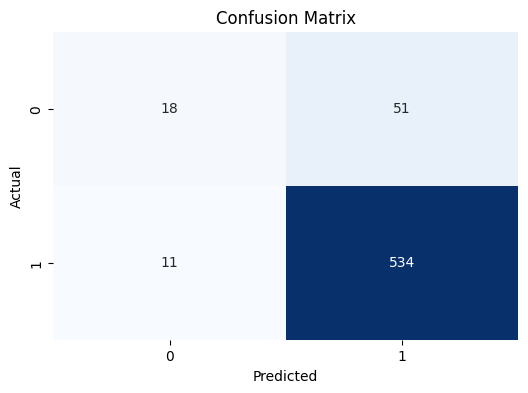

In [105]:
# Initializing the Logistic Regression model
model = LogisticRegression(max_iter=1000)

#Training the model
model.fit(X_train, y_train)

#Making Predictions
y_pred = model.predict(X_test)

#Evaluating the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)
print('Model 1')
print(f"\nModel Evaluation Metrics:")
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

print("\nClassification Report:\n", classification_report(y_test, y_pred))

#Confusion Matrix Visualization
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix')
plt.show()


The logistic regression function worked well with a recall of 97.98% and an accuracy of 89.9%.Let's tune the model while adjusting its parameters.Let us check the output once the model is tuned.

Due to class imbalance I decided to use SMOTE to balance the data.

In [106]:
# Identifying non-numeric columns in X_train
non_numeric_cols = X_train.select_dtypes(include=['object']).columns

# Applying Label Encoding to non-numeric columns
label_encoder = LabelEncoder()
for col in non_numeric_cols:
    X_train[col] = label_encoder.fit_transform(X_train[col].astype(str))
    X_test[col] = label_encoder.transform(X_test[col].astype(str))

# Applying SMOTE after encoding
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

print("SMOTE applied successfully. Data is now balanced.")


SMOTE applied successfully. Data is now balanced.


####Decision Tree

Confusion Matrix:
 [[ 47  22]
 [ 27 518]]

Accuracy: 0.9201954397394136

Precision: 0.9592592592592593

Recall: 0.9504587155963303

F1 Score: 0.9548387096774194

Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.68      0.66        69
         1.0       0.96      0.95      0.95       545

    accuracy                           0.92       614
   macro avg       0.80      0.82      0.81       614
weighted avg       0.92      0.92      0.92       614



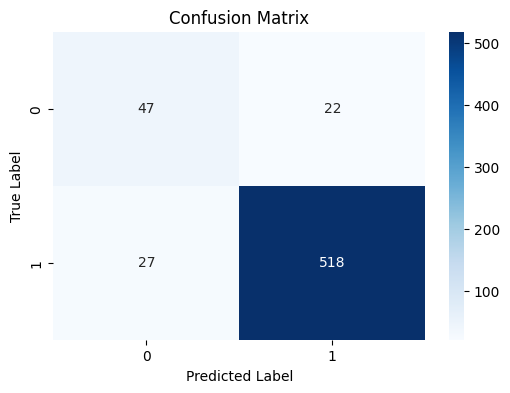

In [107]:
#Splitting the dataset into features (X) and target variable (y)
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Initializing and training the Decision Tree model
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)

# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Plotting the confusion matrix
plt.figure(figsize=(6, 4))
sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='d')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.title('Confusion Matrix')
plt.show()



The model worked well with an accuray of 92.01% and a recall of 95.04%.Let's check how the model works after tuning.Let's tune the model while adjusting its parameters to check if there is any improvement in the output.

Let's look at the decision tree plot.

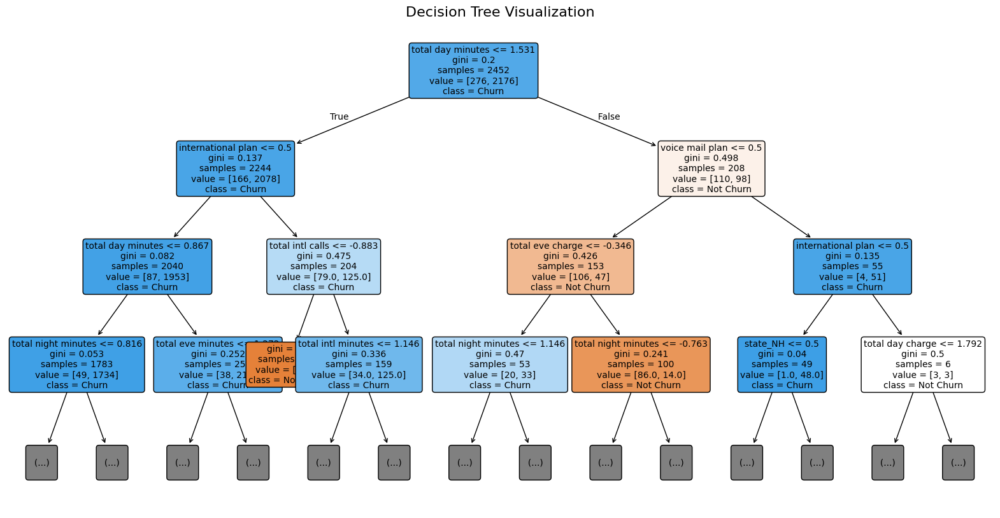

In [108]:
# Initializing and training the Decision Tree model
model = DecisionTreeClassifier(random_state=42)
model.fit(X_train, y_train)
# Seting up the figure size
plt.figure(figsize=(20, 10))
# Ploting the Decision Tree
plot_tree(
    model,
    feature_names=X.columns,       # Feature names from the dataset
    class_names=['Not Churn', 'Churn'],
    filled=True,
    rounded=True,
    fontsize=10,
    max_depth=3
)

plt.title('Decision Tree Visualization', fontsize=16)
plt.show()


Let's check the feature importance in decision trees.

####Random Forest

Confusion Matrix:
 [[ 39  30]
 [  2 543]]

Accuracy: 0.9478827361563518

Precision: 0.9476439790575916

Recall: 0.9963302752293578

F1 Score: 0.9713774597495528

Classification Report:
               precision    recall  f1-score   support

         0.0       0.95      0.57      0.71        69
         1.0       0.95      1.00      0.97       545

    accuracy                           0.95       614
   macro avg       0.95      0.78      0.84       614
weighted avg       0.95      0.95      0.94       614



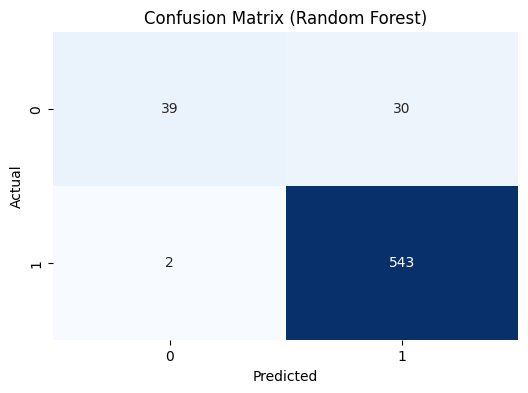

In [109]:
# Splitting the dataset into features (X) and target variable (y)
X = encoded_data.drop(columns=['churn', 'service_calls_category'], errors='ignore')
y = encoded_data['churn']

# Splitting the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Initializing and training the Random Forest model
model = RandomForestClassifier(random_state=42)
model.fit(X_train, y_train)

# Making predictions
y_pred = model.predict(X_test)

# Evaluating the model
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))

# Visualizing the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Random Forest)')
plt.show()


The Random Forest function worked well with a recall of 99.63% and an accuracy of 94.79%.Let's tune the model while adjusting its parameters in order to see if there is an improvement in output.

### Hyperparameter Tuning

**Logistic Regression**




Best Hyperparameters: {'C': 10, 'class_weight': 'balanced', 'penalty': 'l1', 'solver': 'liblinear'}

Confusion Matrix:
 [[ 26  43]
 [ 16 529]]

Accuracy: 0.9039087947882736

Precision: 0.9248251748251748

Recall: 0.9706422018348624

F1 Score: 0.9471799462846912

Classification Report:
               precision    recall  f1-score   support

         0.0       0.62      0.38      0.47        69
         1.0       0.92      0.97      0.95       545

    accuracy                           0.90       614
   macro avg       0.77      0.67      0.71       614
weighted avg       0.89      0.90      0.89       614



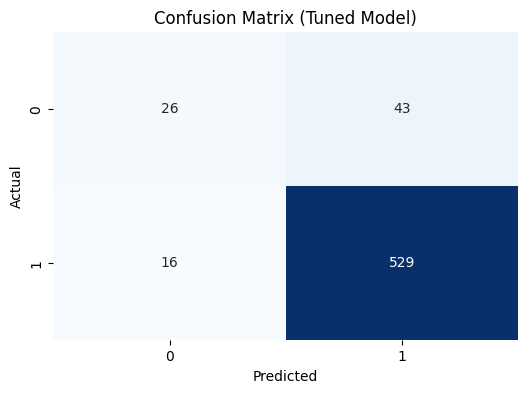

In [110]:
# Applying SMOTE to balance the data
smote = SMOTE(random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train, y_train)

# Setting up hyperparameter tuning with GridSearchCV
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear', 'saga'],
    'class_weight': ['balanced']
}

# Initializing and tuning the Logistic Regression model
model = LogisticRegression(max_iter=1000)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1')
grid_search.fit(X_train_smote, y_train_smote)

# Using the best model from grid search
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Evaluating the tuned model
y_pred = best_model.predict(X_test)

print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nAccuracy:", accuracy_score(y_test, y_pred))
print("\nPrecision:", precision_score(y_test, y_pred))
print("\nRecall:", recall_score(y_test, y_pred))
print("\nF1 Score:", f1_score(y_test, y_pred))

print("\nClassification Report:\n", classification_report(y_test, y_pred))
#Confusion Matrix Visualization
conf_matrix = confusion_matrix(y_test, y_pred)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Tuned Model)')
plt.show()

The tuned logistic regression function worked well with an accuracy of 90.39% though recall reduced to 97.06%.the best parameters after tuning is {'C': 10, 'class_weight': 'balanced', 'penalty': 'l1', 'solver': 'liblinear'}.

Since States are taking over in this we will perform regularizationwith L1 reducing the impact of unnecessary features.

In [111]:
# Defining hyperparameters with strong regularization
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10],
    'penalty': ['l1', 'l2'],
    'solver': ['liblinear'],
    'class_weight': ['balanced']
}

# Logistic Regression with GridSearchCV
model = LogisticRegression(max_iter=1000, random_state=42)
grid_search = GridSearchCV(model, param_grid, cv=5, scoring='f1')
grid_search.fit(X_train, y_train)

# Best model and parameters
best_model = grid_search.best_estimator_
print("Best Hyperparameters:", grid_search.best_params_)

# Predictions and evaluation
y_pred = best_model.predict(X_test)
print("\nConfusion Matrix:\n", confusion_matrix(y_test, y_pred))
print("\nClassification Report:\n", classification_report(y_test, y_pred))


Best Hyperparameters: {'C': 0.1, 'class_weight': 'balanced', 'penalty': 'l1', 'solver': 'liblinear'}

Confusion Matrix:
 [[ 58  11]
 [118 427]]

Classification Report:
               precision    recall  f1-score   support

         0.0       0.33      0.84      0.47        69
         1.0       0.97      0.78      0.87       545

    accuracy                           0.79       614
   macro avg       0.65      0.81      0.67       614
weighted avg       0.90      0.79      0.82       614



Checking importance of features that would help in determining churn.

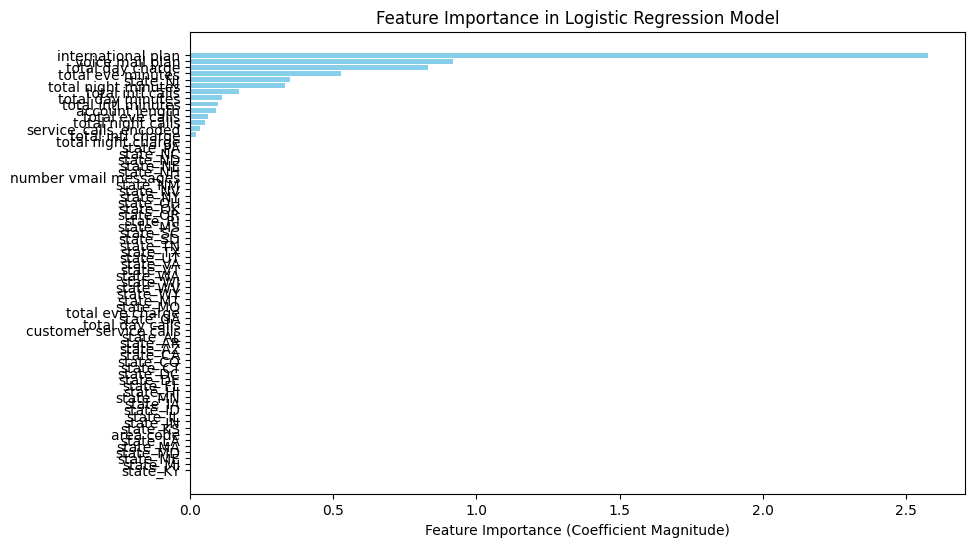

In [112]:
# Getting the coefficients from the model
coefficients = best_model.coef_[0]

# Creating a DataFrame to visualize feature importance
feature_importance = pd.DataFrame({
    'Feature': X_train.columns,
    'Importance': np.abs(coefficients)
})

# Sorting by importance
feature_importance = feature_importance.sort_values(by='Importance', ascending=False)

# Plotting feature importance
plt.figure(figsize=(10, 6))
plt.barh(feature_importance['Feature'], feature_importance['Importance'], color='skyblue')
plt.xlabel('Feature Importance (Coefficient Magnitude)')
plt.title('Feature Importance in Logistic Regression Model')
plt.gca().invert_yaxis()
plt.show()

**Decision tree**

Best Hyperparameters (Decision Tree): {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}

Decision Tree - Tuned Model Evaluation:
Confusion Matrix:
 [[ 46  23]
 [ 18 527]]

Accuracy: 0.9332247557003257

Precision: 0.9581818181818181

Recall: 0.9669724770642202

F1 Score: 0.9625570776255707

Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.67      0.69        69
         1.0       0.96      0.97      0.96       545

    accuracy                           0.93       614
   macro avg       0.84      0.82      0.83       614
weighted avg       0.93      0.93      0.93       614



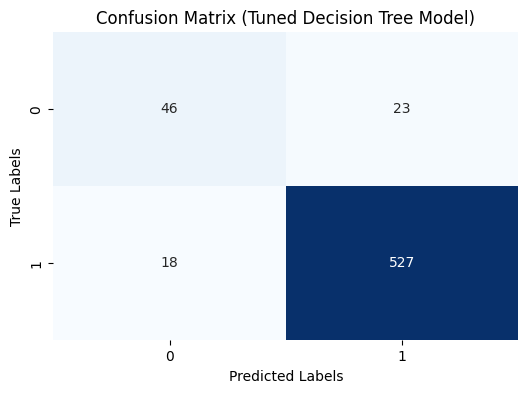

In [113]:
# Hyperparameter tuning for Decision Tree
param_grid = {
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(DecisionTreeClassifier(random_state=42), param_grid, cv=5, scoring='f1')
grid_search.fit(X_train, y_train)

best_dt_model = grid_search.best_estimator_
print("Best Hyperparameters (Decision Tree):", grid_search.best_params_)

# Making predictions
y_pred_dt = best_dt_model.predict(X_test)

# Evaluating the model
print("\nDecision Tree - Tuned Model Evaluation:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_dt))
print("\nAccuracy:", accuracy_score(y_test, y_pred_dt))
print("\nPrecision:", precision_score(y_test, y_pred_dt))
print("\nRecall:", recall_score(y_test, y_pred_dt))
print("\nF1 Score:", f1_score(y_test, y_pred_dt))
print("\nClassification Report:\n", classification_report(y_test, y_pred_dt))

# Plotting the confusion matrix
conf_matrix = confusion_matrix(y_test, y_pred_dt)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix (Tuned Decision Tree Model)')
plt.show()

The tuned model did better with an accuracy of 93.32% and Recall of 96.7%.The best parameters after tuning is {'max_depth': 10, 'min_samples_leaf': 4, 'min_samples_split': 10}.

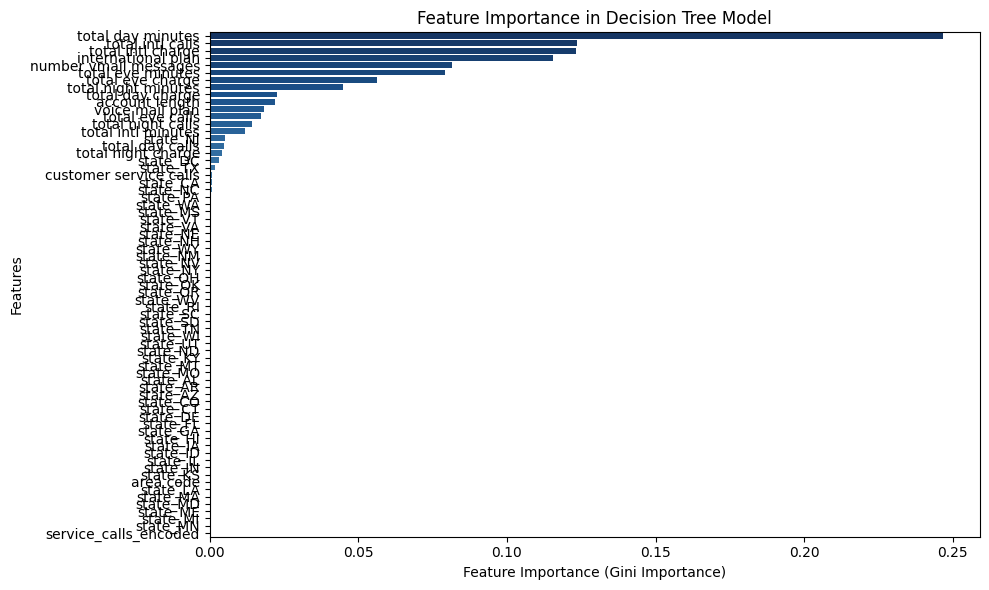

                  Feature  Importance
5       total day minutes    0.246794
15       total intl calls    0.123428
16      total intl charge    0.123175
2      international plan    0.115504
4   number vmail messages    0.081583
8       total eve minutes    0.079204
10       total eve charge    0.056157
11    total night minutes    0.044907
7        total day charge    0.022674
0          account length    0.022137


In [114]:
# Get feature importance
feature_importances = best_dt_model.feature_importances_

# Create a DataFrame to visualize feature importances
features = X_train.columns
importance_df = pd.DataFrame({
    'Feature': features,
    'Importance': feature_importances
}).sort_values(by='Importance', ascending=False)

# Plotting feature importance
plt.figure(figsize=(10, 6))
sns.barplot(x='Importance', y='Feature', data=importance_df, palette='Blues_r')
plt.title('Feature Importance in Decision Tree Model')
plt.xlabel('Feature Importance (Gini Importance)')
plt.ylabel('Features')
plt.tight_layout()
plt.show()

# Display top 10 most important features
print(importance_df.head(10))

We can see that the top features impacting churn in decision trees total day minutes,total international calls and total international charge.

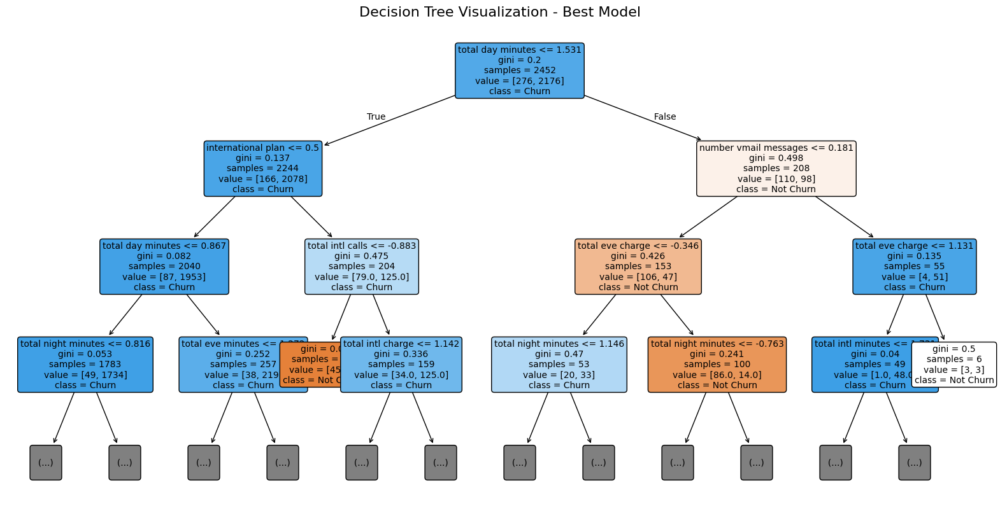

In [115]:
#Plotting the tuned Decision Tree
# Seting up the figure size
plt.figure(figsize=(20, 10))

# Ploting the Decision Tree
plot_tree(
    best_dt_model,
    feature_names=X.columns,
    class_names=['Not Churn', 'Churn'],
    filled=True,
    rounded=True,
    fontsize=10,
    max_depth=3
)
plt.title('Decision Tree Visualization - Best Model', fontsize=16)
plt.show()


**Random Forest**

Best Hyperparameters (Random Forest): {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50}

Random Forest - Tuned Model Evaluation:
Confusion Matrix:
 [[ 37  32]
 [  1 544]]

Accuracy: 0.9462540716612378

Precision: 0.9444444444444444

Recall: 0.998165137614679

F1 Score: 0.9705619982158786

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.54      0.69        69
         1.0       0.94      1.00      0.97       545

    accuracy                           0.95       614
   macro avg       0.96      0.77      0.83       614
weighted avg       0.95      0.95      0.94       614



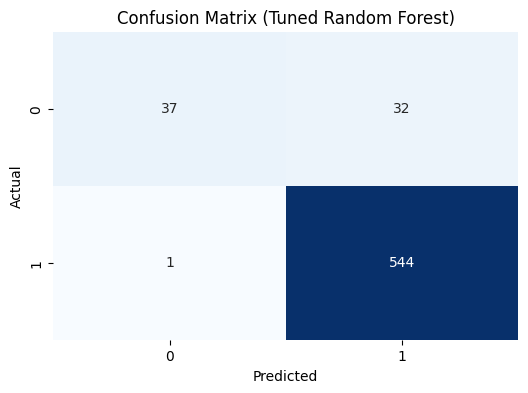

In [116]:
# Hyperparameter tuning for Random Forest
param_grid = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search = GridSearchCV(RandomForestClassifier(random_state=42), param_grid, cv=5, scoring='f1')
grid_search.fit(X_train, y_train)

best_rf_model = grid_search.best_estimator_
print("Best Hyperparameters (Random Forest):", grid_search.best_params_)

# Making predictions with the best model
y_pred_rf = best_rf_model.predict(X_test)

# Evaluating the tuned model
print("\nRandom Forest - Tuned Model Evaluation:")
print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred_rf))
print("\nAccuracy:", accuracy_score(y_test, y_pred_rf))
print("\nPrecision:", precision_score(y_test, y_pred_rf))
print("\nRecall:", recall_score(y_test, y_pred_rf))
print("\nF1 Score:", f1_score(y_test, y_pred_rf))
print("\nClassification Report:\n", classification_report(y_test, y_pred_rf))

# Visualizing the confusion matrix for the tuned model
conf_matrix = confusion_matrix(y_test, y_pred_rf)
plt.figure(figsize=(6, 4))
sns.heatmap(conf_matrix, annot=True, cmap='Blues', fmt='d', cbar=False)
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix (Tuned Random Forest)')
plt.show()


With the tuned model the accuracy reduced to 94.63% and the recall increased to 99.82%.The best parameters were
 'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 10, 'n_estimators': 50

Let's perform feature importance to check which features impacts churn.

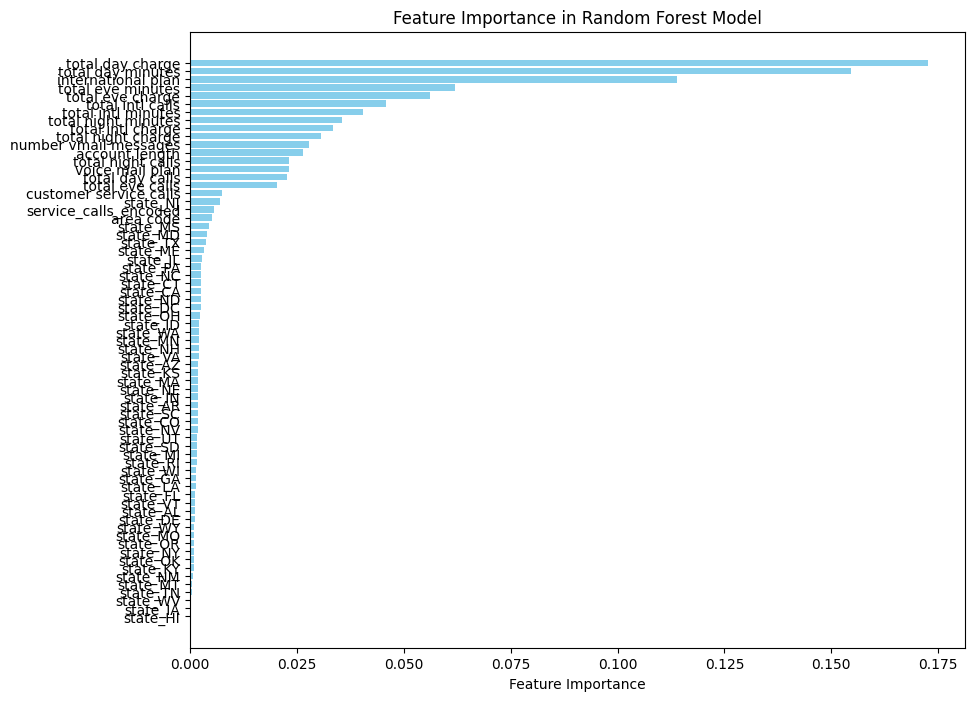

In [117]:
# Feature Importance for Random Forest
feature_importances = best_rf_model.feature_importances_
feature_names = X_train.columns

# Sort features by importance
sorted_indices = np.argsort(feature_importances)
plt.figure(figsize=(10, 8))
plt.barh(np.array(feature_names)[sorted_indices], feature_importances[sorted_indices], color='skyblue')
plt.xlabel('Feature Importance')
plt.title('Feature Importance in Random Forest Model')
plt.show()

We can see that the top 3 features are total day charge,totalday minutes and international plan.

## Model Evaluation

The metrics for evaluation that I focussed on with modelling is Accuracy and Recall.Recall is beneficial to the business since we are focusing on client retention.The best performing model is Random Forest with a Recall of 99.82% and accuracy of 94.63% Since we are foccused on predicting churn and customer retention.Which is can be seen with the output below.


Logistic Regression (Untuned) Evaluation:
Confusion Matrix:
 [[ 18  51]
 [ 11 534]]

Accuracy: 0.8990228013029316

Precision: 0.9128205128205128

Recall: 0.9798165137614679

F1 Score: 0.9451327433628318

Classification Report:
               precision    recall  f1-score   support

         0.0       0.62      0.26      0.37        69
         1.0       0.91      0.98      0.95       545

    accuracy                           0.90       614
   macro avg       0.77      0.62      0.66       614
weighted avg       0.88      0.90      0.88       614



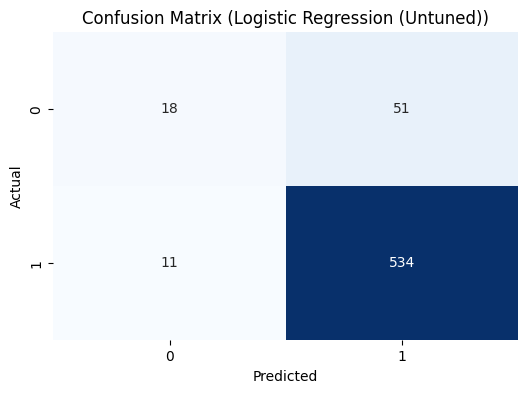


Logistic Regression (Tuned) Evaluation:
Confusion Matrix:
 [[ 58  11]
 [118 427]]

Accuracy: 0.7899022801302932

Precision: 0.9748858447488584

Recall: 0.7834862385321101

F1 Score: 0.8687690742624619

Classification Report:
               precision    recall  f1-score   support

         0.0       0.33      0.84      0.47        69
         1.0       0.97      0.78      0.87       545

    accuracy                           0.79       614
   macro avg       0.65      0.81      0.67       614
weighted avg       0.90      0.79      0.82       614



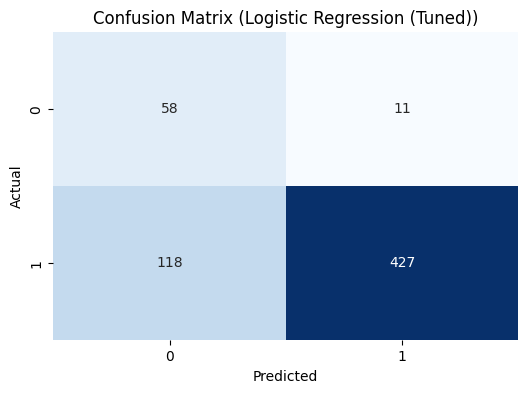


Decision Tree (Untuned) Evaluation:
Confusion Matrix:
 [[ 47  22]
 [ 27 518]]

Accuracy: 0.9201954397394136

Precision: 0.9592592592592593

Recall: 0.9504587155963303

F1 Score: 0.9548387096774194

Classification Report:
               precision    recall  f1-score   support

         0.0       0.64      0.68      0.66        69
         1.0       0.96      0.95      0.95       545

    accuracy                           0.92       614
   macro avg       0.80      0.82      0.81       614
weighted avg       0.92      0.92      0.92       614



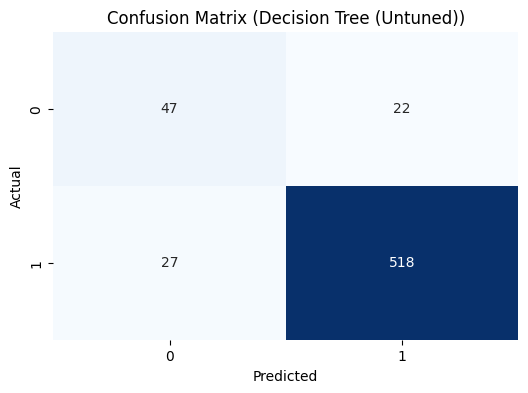


Decision Tree (Tuned) Evaluation:
Confusion Matrix:
 [[ 46  23]
 [ 18 527]]

Accuracy: 0.9332247557003257

Precision: 0.9581818181818181

Recall: 0.9669724770642202

F1 Score: 0.9625570776255707

Classification Report:
               precision    recall  f1-score   support

         0.0       0.72      0.67      0.69        69
         1.0       0.96      0.97      0.96       545

    accuracy                           0.93       614
   macro avg       0.84      0.82      0.83       614
weighted avg       0.93      0.93      0.93       614



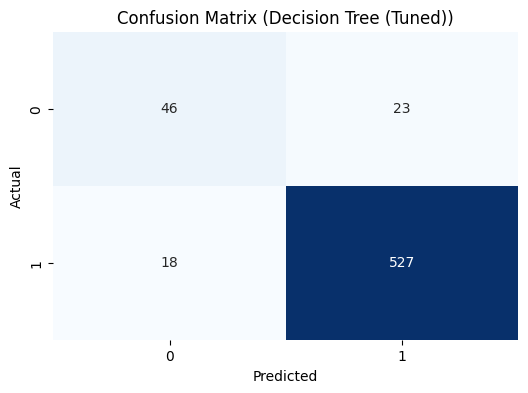


Random Forest (Untuned) Evaluation:
Confusion Matrix:
 [[ 39  30]
 [  2 543]]

Accuracy: 0.9478827361563518

Precision: 0.9476439790575916

Recall: 0.9963302752293578

F1 Score: 0.9713774597495528

Classification Report:
               precision    recall  f1-score   support

         0.0       0.95      0.57      0.71        69
         1.0       0.95      1.00      0.97       545

    accuracy                           0.95       614
   macro avg       0.95      0.78      0.84       614
weighted avg       0.95      0.95      0.94       614



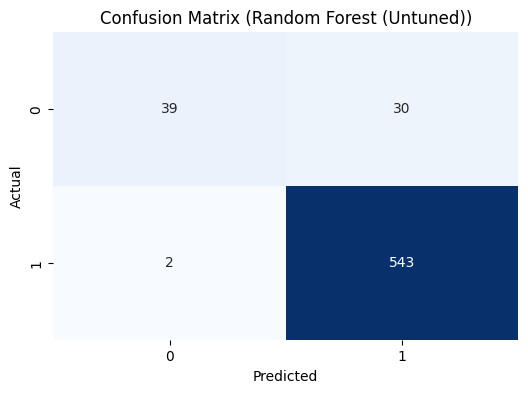


Random Forest (Tuned) Evaluation:
Confusion Matrix:
 [[ 37  32]
 [  1 544]]

Accuracy: 0.9462540716612378

Precision: 0.9444444444444444

Recall: 0.998165137614679

F1 Score: 0.9705619982158786

Classification Report:
               precision    recall  f1-score   support

         0.0       0.97      0.54      0.69        69
         1.0       0.94      1.00      0.97       545

    accuracy                           0.95       614
   macro avg       0.96      0.77      0.83       614
weighted avg       0.95      0.95      0.94       614



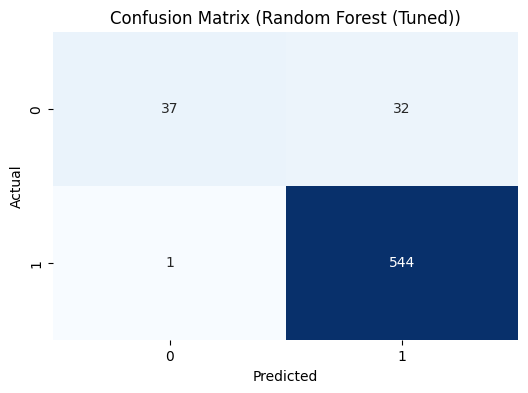

In [118]:

# Defining all models (tuned and untuned)
models = {
    'Logistic Regression (Untuned)': LogisticRegression(max_iter=1000),
    'Logistic Regression (Tuned)': best_model,
    'Decision Tree (Untuned)': DecisionTreeClassifier(random_state=42),
    'Decision Tree (Tuned)': best_dt_model,
    'Random Forest (Untuned)': RandomForestClassifier(random_state=42),
    'Random Forest (Tuned)': best_rf_model
}

# Iterating over all models and evaluate them
for model_name, model in models.items():
    # Fit the untuned models only
    if 'Untuned' in model_name:
        model.fit(X_train, y_train)

    # Make predictions
    y_pred = model.predict(X_test)

    # Evaluation metrics
    print(f"\n{model_name} Evaluation:")
    print("Confusion Matrix:\n", confusion_matrix(y_test, y_pred))
    print("\nAccuracy:", accuracy_score(y_test, y_pred))
    print("\nPrecision:", precision_score(y_test, y_pred))
    print("\nRecall:", recall_score(y_test, y_pred))
    print("\nF1 Score:", f1_score(y_test, y_pred))
    print("\nClassification Report:\n", classification_report(y_test, y_pred))

    # Confusion Matrix Visualization
    plt.figure(figsize=(6, 4))
    sns.heatmap(confusion_matrix(y_test, y_pred), annot=True, cmap='Blues', fmt='d', cbar=False)
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(f'Confusion Matrix ({model_name})')
    plt.show()


## Conclusion and Recommendation.

###Conclusion.

**Model Performance**

The Random Forest model outperformed the other models, achieving a recall of 99.63% and an accuracy of 94.79% before tuning. After tuning, the recall remained strong, indicating its robustness in identifying churn cases accurately.The Decision Tree model also performed well, especially after tuning, with a recall of 96.7% and an accuracy of 93.32%.The Logistic Regression model, while offering insights into feature importance, showed slightly lower performance compared to tree-based models. The recall decreased to 97.06% after tuning, with an accuracy of 90.39%.

 **Feature Importance**

The top features influencing churn varied across models:
Logistic Regression: International plan, voicemail plan, and total day plan were significant.
Decision Tree: Total day minutes, total international calls, and total international charge were prominent.
Random Forest: Further validated the importance of these features, emphasizing total usage metrics and international service plans.

The major impact of the International Plan feature across all models indicates that customers with this plan are more likely to churn. This raises the possibility of a pricing or value perception conflict.
Another important component of the Logistic Regression model was the Voicemail Plan. This plan may not be valuable to customers, which would increase churn.

**Patterns of Call Usage:**

Two powerful indicators of churn are total international calls and total day minutes. High usage in these locations could be a sign that a better plan is needed or that call quality and pricing aren't meeting your needs.

###Recommendations

1. Use the International Plan to develop exclusive deals or customer retention tactics. This could include better-value combined deals, discounts, or promotions.
To better serve clients with high daytime usage and lower churn risk, create individualized strategies for them.

2.  Strategies for Preventing Churn:
For high-risk clients, put in place a proactive customer interaction program. When usage patterns resemble those of likely churners, for instance, offers may be sent or satisfaction surveys may be carried out
3. Deployment of the Model:
For production use, implement the Random Forest model since it provides the optimal balance between recall and accuracy, guaranteeing a low number of false negatives in churn prediction.
4. Observation and Iteration:
To maintain accuracy, keep an eye on the model's performance at all times and retrain it occasionally using new data.
Create feature drift notifications, particularly if usage trends change over time.